In [350]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [351]:
np.random.seed(42)

In [352]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=20,n_clusters=3,correlation=0.4,random_state=42)

In [353]:
X, y = cluster_generator.generate_clusters()

In [354]:
X = X + np.random.normal(scale=3,size=X.shape) 

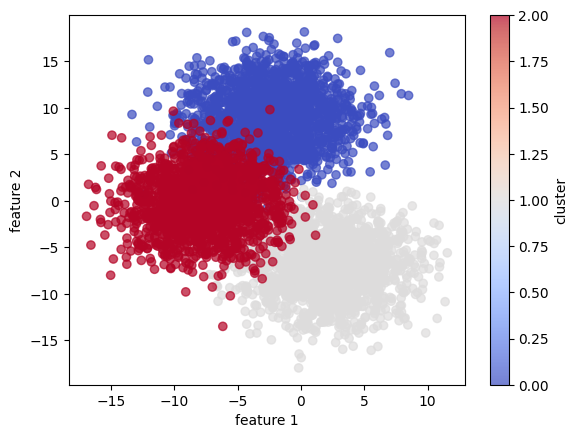

In [355]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

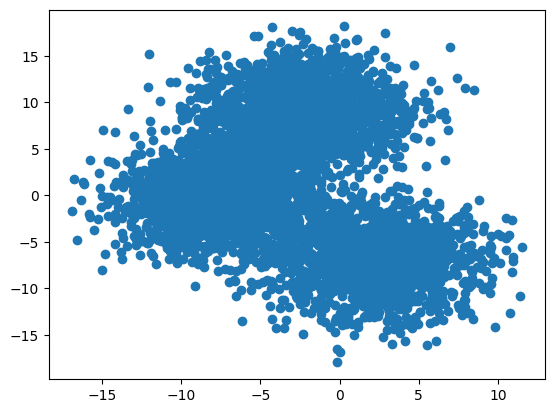

In [356]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [357]:
corr_dataset = pd.DataFrame(X) 

In [358]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [359]:
corr_dataset['target'] = y

In [360]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,4.984849,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,11.576731,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,11.032535,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,12.996739,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,8.678491,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,10.599177,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,2.662411,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,9.029980,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.095781,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2


In [361]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [362]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.277832,0.292528,-0.629823,0.344350,0.112757,-0.176286,0.027423,0.098610,-0.090910,-0.291897,-0.487709,-0.653202,0.028339,0.328504,-0.115318,0.399718,-0.099696,0.683877,0.235957
vab_2,-0.277832,1.000000,0.542610,0.266989,-0.523630,-0.749529,-0.284910,0.602031,0.059444,0.771791,-0.555181,0.773129,0.642292,-0.745476,-0.802097,-0.668670,0.030753,0.678169,-0.242618,-0.312927
vab_3,0.292528,0.542610,1.000000,-0.307205,-0.224507,-0.637978,-0.453585,0.604385,0.125212,0.657936,-0.807186,0.315591,0.035937,-0.716294,-0.501084,-0.764688,0.375568,0.573062,0.369403,-0.100326
vab_4,-0.629823,0.266989,-0.307205,1.000000,-0.272626,-0.056506,0.236773,-0.022676,-0.053967,0.083648,0.356366,0.498247,0.669210,0.026876,-0.274871,0.183657,-0.376666,0.093684,-0.690585,-0.205357
vab_5,0.344350,-0.523630,-0.224507,-0.272626,1.000000,0.484923,0.138094,-0.293956,0.037212,-0.446598,0.267311,-0.536916,-0.507560,0.454589,0.554156,0.376177,0.116461,-0.396236,0.321512,0.281596
vab_6,0.112757,-0.749529,-0.637978,-0.056506,0.484923,1.000000,0.379219,-0.602346,-0.052569,-0.755262,0.683116,-0.637914,-0.444098,0.783122,0.748481,0.744265,-0.123146,-0.654204,0.061327,0.282192
vab_7,-0.176286,-0.284910,-0.453585,0.236773,0.138094,0.379219,1.000000,-0.306723,-0.043894,-0.352100,0.509522,-0.140511,0.036579,0.432606,0.292128,0.473562,-0.228099,-0.296691,-0.233073,0.096430
vab_8,0.027423,0.602031,0.604385,-0.022676,-0.293956,-0.602346,-0.306723,1.000000,0.095037,0.621900,-0.597232,0.466659,0.284382,-0.638444,-0.555336,-0.616404,0.206487,0.555270,0.078256,-0.170913
vab_9,0.098610,0.059444,0.125212,-0.053967,0.037212,-0.052569,-0.043894,0.095037,1.000000,0.098249,-0.098813,0.032977,-0.022593,-0.073719,-0.030694,-0.073392,0.089195,0.090862,0.101364,0.049268
vab_10,-0.090910,0.771791,0.657936,0.083648,-0.446598,-0.755262,-0.352100,0.621900,0.098249,1.000000,-0.670319,0.653735,0.461191,-0.773414,-0.738923,-0.728915,0.155450,0.680001,-0.046002,-0.261533


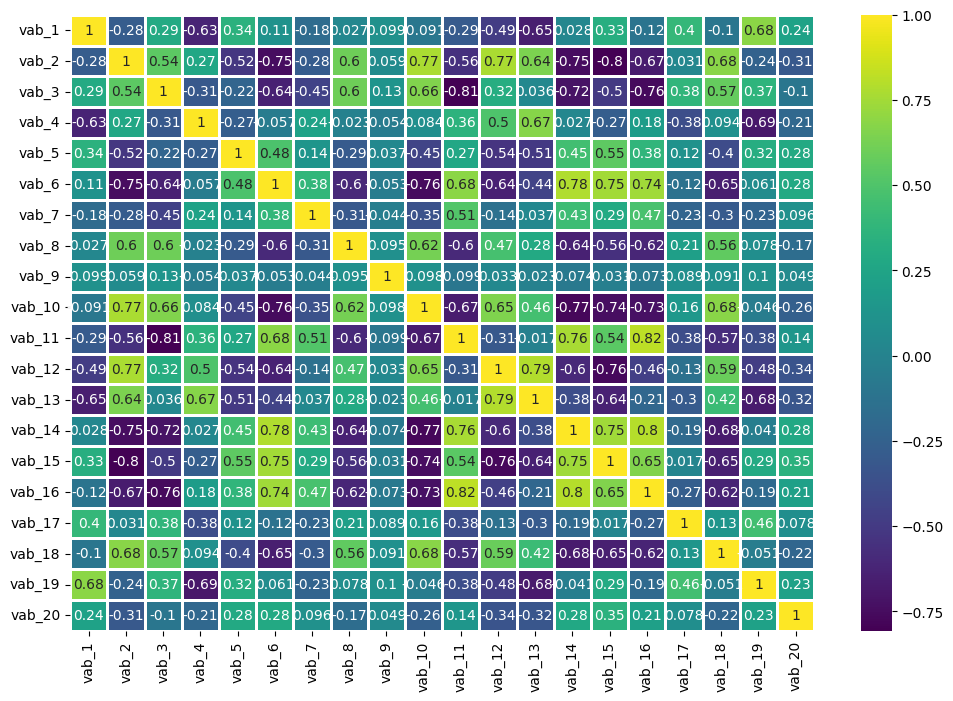

In [363]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='viridis',annot=True,linewidths=1)
plt.show()

## data standardization

In [364]:
X_values = corr_dataset.iloc[:,:-1].values

In [365]:
y_values = corr_dataset.iloc[:,-1].values

In [366]:
scaler = StandardScaler()

In [367]:
X_values = scaler.fit_transform(X_values)

In [368]:
np.mean(X_values),np.std(X_values)

(-1.0548673668147145e-16, 0.9999999999999998)

In [369]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.561998,1.124964,0.905237,0.581700,-0.047820,-1.110851,0.518746,0.623363,0.722327,0.949032,-1.351689,0.285433,0.732165,-1.025030,-1.129030,-1.265542,-1.533002,1.488011,-0.442054,0.425137
1,0.408386,0.538544,0.683251,0.742999,0.195658,-0.943052,-1.274347,-0.282230,0.573147,0.600698,-1.120184,1.163203,0.312532,-1.380845,-0.803349,-1.408595,-0.548839,1.251529,-0.335872,-0.471999
2,0.676621,0.602732,1.435131,-0.515720,-1.066677,-1.184544,-0.881931,-0.132624,1.009342,1.806801,-1.233847,1.090738,0.306082,-1.769639,-1.182142,-1.647682,0.508110,0.394486,-0.890035,-3.854815
3,-0.283615,1.463688,1.822475,-0.829129,-0.000158,-1.688905,-0.544698,1.132618,0.542759,0.235141,-0.893135,1.352289,0.997236,-0.968077,-1.253007,-1.681276,0.824268,1.116737,0.098919,-0.104525
4,-0.010078,0.982962,0.765012,-0.030037,0.631954,-1.605812,0.054600,1.620361,-1.224210,1.485904,-1.288900,0.777276,1.278843,-0.851562,-1.658777,-1.043128,-0.447240,0.698519,0.202941,0.745614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-1.808602,-0.319973,-0.522665,2.246241,1.237873,0.548235,0.723391,-0.498638,1.048083,-0.018549,0.767598,1.033032,0.523263,0.989062,-0.604100,1.024524,-0.871174,0.917033,-1.153201,-0.768510
4994,-0.936909,0.203729,-1.078358,0.791627,-0.251895,0.396948,0.864612,-0.601157,0.580928,-0.647653,1.443951,-0.023820,1.464148,0.976000,-0.175517,0.691154,-1.491744,-0.278161,-1.074015,0.175348
4995,-1.129113,0.323731,0.168517,0.371278,-0.345936,0.359667,-0.006274,-0.482595,0.016967,0.179308,0.899739,0.824079,1.761878,1.521319,-0.193444,1.566561,-1.240942,-0.259747,-1.088728,-0.777360
4996,-0.483031,0.389621,-0.833726,0.355007,1.595856,1.361261,0.868434,-0.310264,0.883197,-0.683926,1.468412,0.433364,0.448668,0.088805,0.413799,0.319605,-0.555341,0.169138,-0.860172,-1.610051


<Axes: ylabel='Density'>

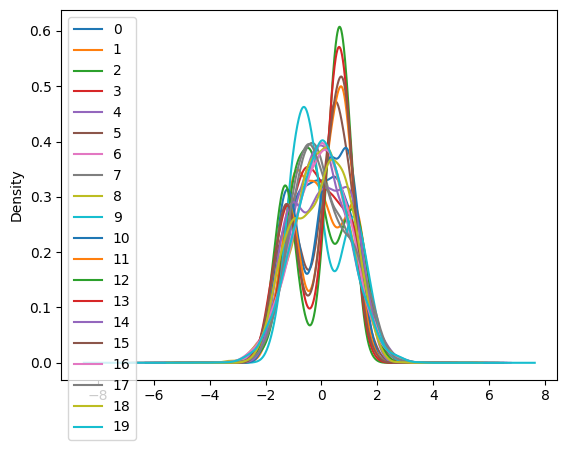

In [370]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [371]:
pca_general = PCA()

In [372]:
pca_general.fit(X_values)

PCA()

In [373]:
explained_variance = pca_general.explained_variance_ratio_

In [374]:
explained_variance

array([0.42446661, 0.22045718, 0.0515562 , 0.04154902, 0.03668542,
       0.03272318, 0.03000375, 0.02236128, 0.01981449, 0.01816046,
       0.01468805, 0.01230404, 0.01154024, 0.01102603, 0.01058135,
       0.00958151, 0.0090893 , 0.00863066, 0.00773641, 0.00704483])

In [375]:
eigenvalues = pca_general.explained_variance_

In [376]:
pd.DataFrame(eigenvalues)

,0
0,8.491031
1,4.410026
2,1.031330
3,0.831147
4,0.733855
5,0.654595
6,0.600195
7,0.447315
8,0.396369
9,0.363282


In [377]:
eigenvectors = pca_general.components_

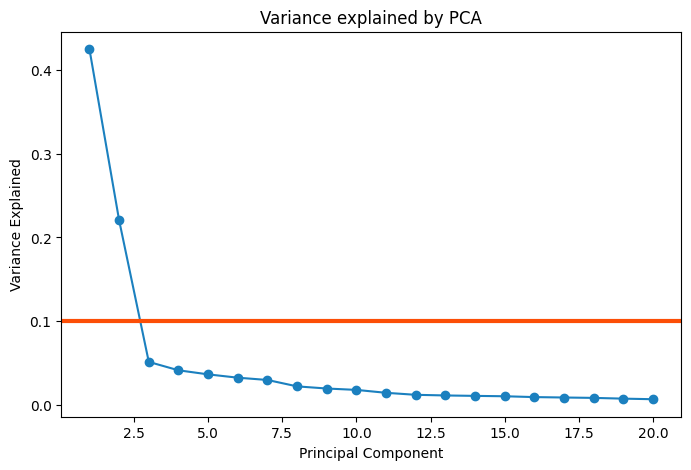

In [378]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [379]:
pca = PCA(n_components=2)

In [380]:
principal_components = pca.fit_transform(X_values)

In [381]:
pd.DataFrame(principal_components).head(8)

,0,1
0,-3.165672,-0.150920
1,-3.015109,0.173062
2,-4.392922,0.504150
3,-4.119958,0.952808
4,-3.567550,0.212141
5,-3.563821,0.528484
6,-4.304769,-0.170831
7,-2.713243,0.297592


In [382]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [383]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [384]:
final_df

,principal component 1,principal component 2,target
0,-3.165672,-0.150920,0
1,-3.015109,0.173062,0
2,-4.392922,0.504150,0
3,-4.119958,0.952808,0
4,-3.567550,0.212141,0
...,...,...,...
4993,0.511236,-3.356043,2
4994,1.289361,-3.154428,2
4995,0.383618,-3.001600,2
4996,1.317817,-1.870773,2


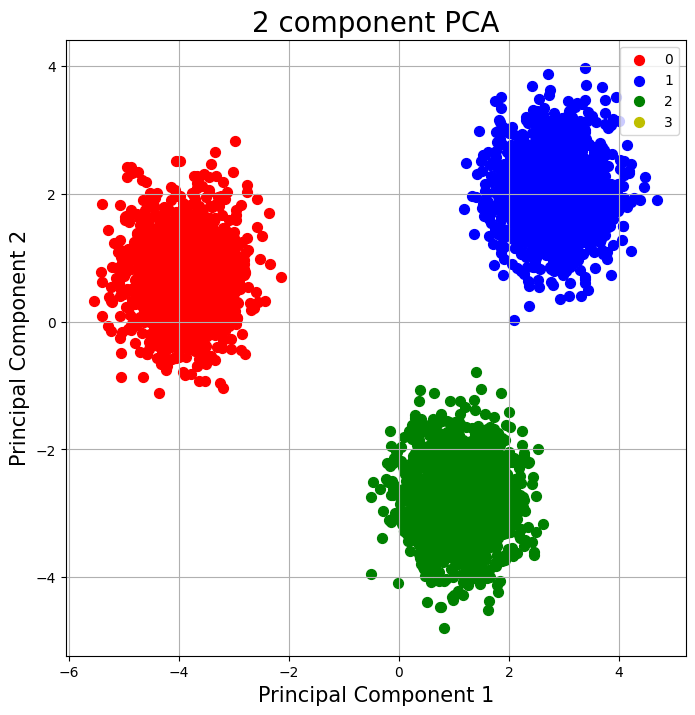

In [385]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

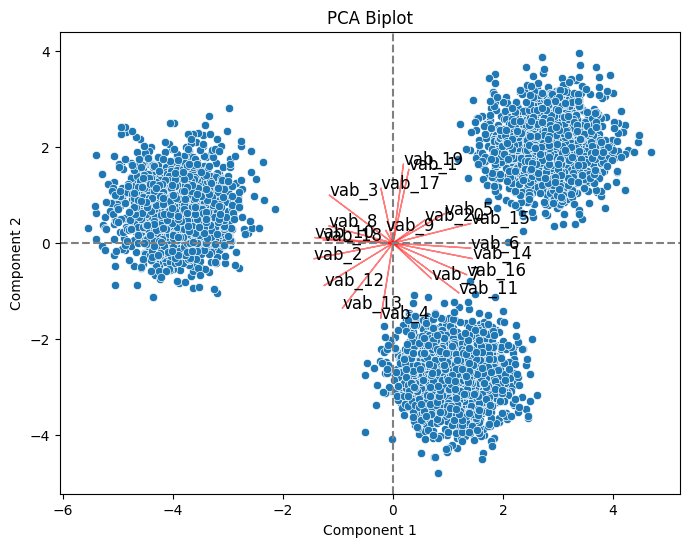

In [386]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

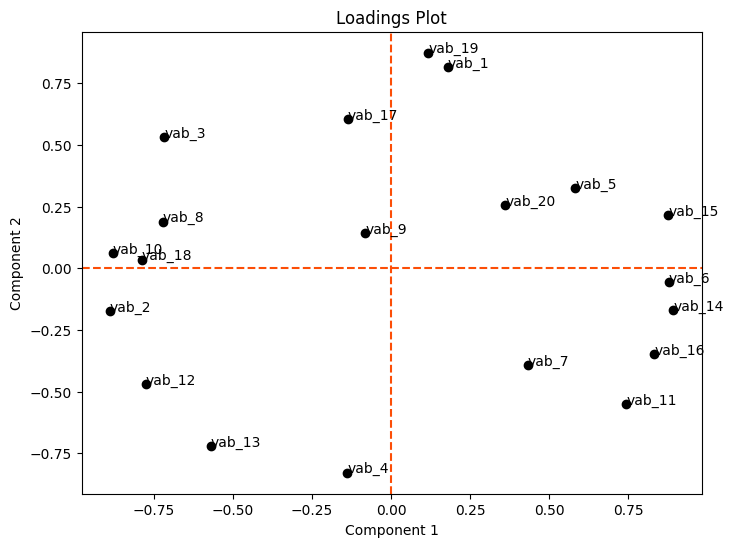

In [387]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [388]:
X_pca = pca.transform(X_values)

In [389]:
pd.DataFrame(X_pca).head()

,0,1
0,-3.165672,-0.150920
1,-3.015109,0.173062
2,-4.392922,0.504150
3,-4.119958,0.952808
4,-3.567550,0.212141


## t-SNE

In [390]:
tsne = TSNE(n_components=2,random_state=42)

In [391]:
X_tsne = tsne.fit_transform(X_values)

In [392]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [393]:
tsne_data

,dim_1,dim_2,target
0,-27.796259,-8.392476,0
1,-27.503315,6.994094,0
2,-35.484844,24.890163,0
3,-33.403191,1.535182,0
4,-57.923279,2.149462,0
...,...,...,...
4993,-10.181720,-28.140427,2
4994,7.834108,-19.984369,2
4995,2.732781,-44.321957,2
4996,-7.992928,-29.764204,2


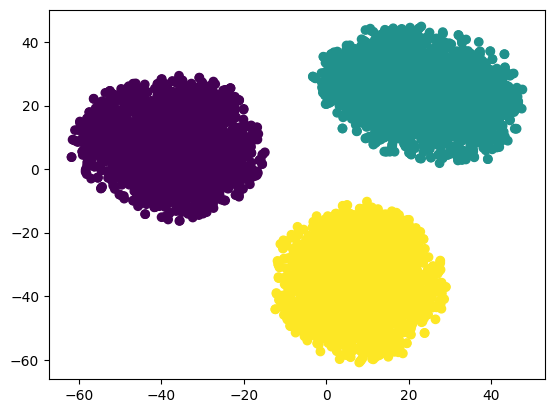

In [394]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [395]:
tsne.kl_divergence_

2.4930005073547363

## umap

In [396]:
umap = umap.UMAP(random_state=42)

In [397]:
X_umap = umap.fit_transform(X_values)

In [398]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [399]:
umap_data

,dim_1,dim_2,target
0,15.419041,2.923173,0
1,15.218882,2.091812,0
2,14.484726,0.480538,0
3,15.497456,2.418777,0
4,14.148243,3.158143,0
...,...,...,...
4993,-1.419365,0.646279,2
4994,-1.005870,1.325607,2
4995,-2.382665,0.657034,2
4996,-1.721438,1.104583,2


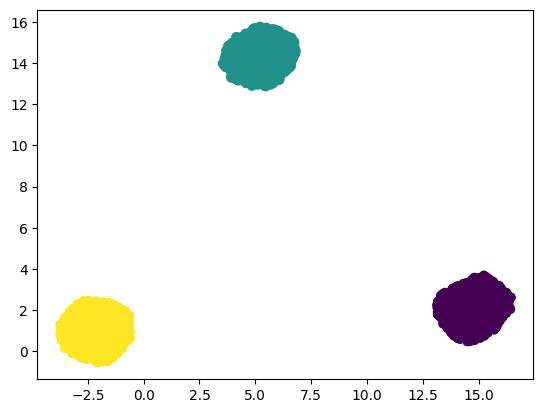

In [400]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [401]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [402]:
kmeans.fit(X_values)

KMeans(n_clusters=3, random_state=42)

In [403]:
df_kmeans = corr_dataset.copy()

In [404]:
df_kmeans['k_means'] = kmeans.labels_

In [405]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [406]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [407]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


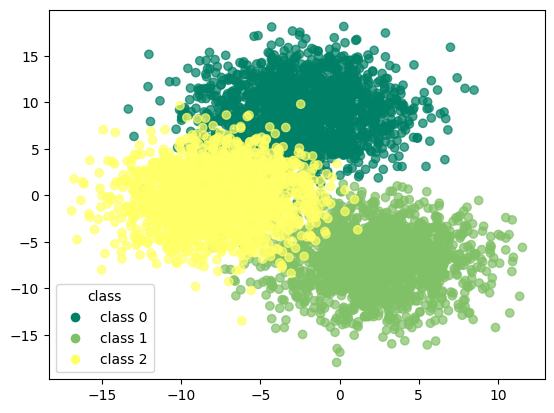

In [408]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

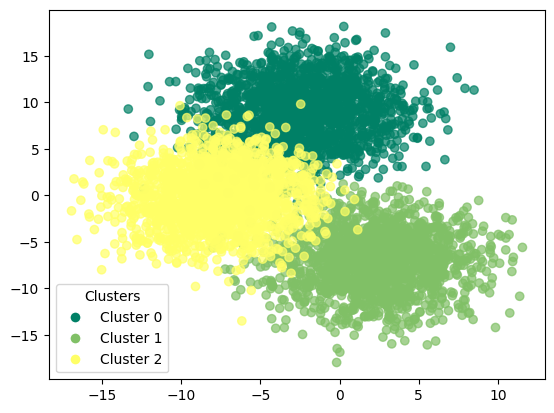

In [409]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [410]:
kmeans.cluster_centers_

array([[ 0.94526654, -1.05578717, -0.18527945, -0.94278133,  0.83109185,
         0.79907154,  0.04190786, -0.51805192,  0.03564451, -0.80787866,
         0.17852952, -1.24364867, -1.30155861,  0.70553419,  1.07452517,
         0.46444111,  0.40357493, -0.73463278,  0.96941317,  0.53854444],
       [-0.983022  , -0.09577642, -0.96971218,  1.04083279, -0.18000316,
         0.40445306,  0.6352522 , -0.49725048, -0.17218079, -0.40661627,
         1.03772083,  0.35351805,  0.77714016,  0.56993323,  0.04151396,
         0.78941067, -0.76599147, -0.31857151, -1.11285298, -0.16649202],
       [ 0.03775546,  1.15156359,  1.15499163, -0.09805146, -0.65108869,
        -1.20352461, -0.67716007,  1.0153024 ,  0.13653629,  1.21449493,
        -1.21625035,  0.89013062,  0.52441845, -1.27546742, -1.11603913,
        -1.25385178,  0.36241655,  1.05320429,  0.14343981, -0.37205242]])

In [411]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [412]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### k-means with pca

In [413]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [414]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [415]:
df_pca_kmeans = corr_dataset.copy()

In [416]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [417]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,1
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,1
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,1
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,1
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [418]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.3333333333333333
accuracy after: 1.0


In [419]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


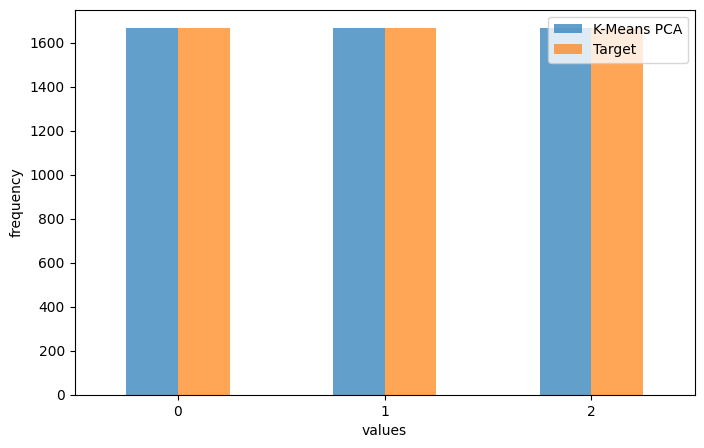

In [420]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [421]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [422]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



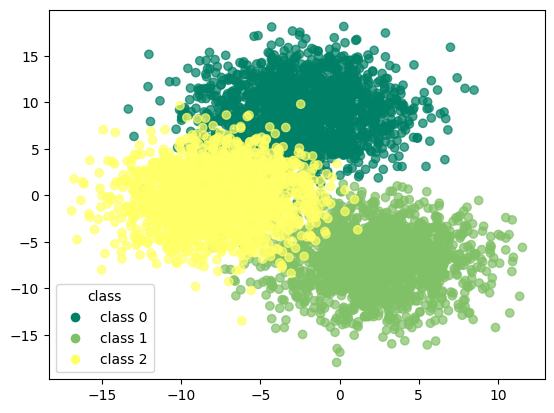

In [423]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

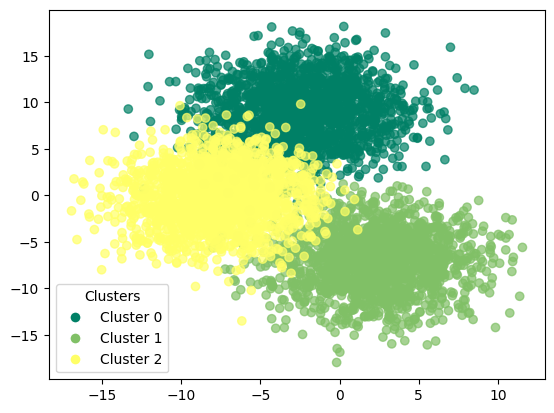

In [424]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

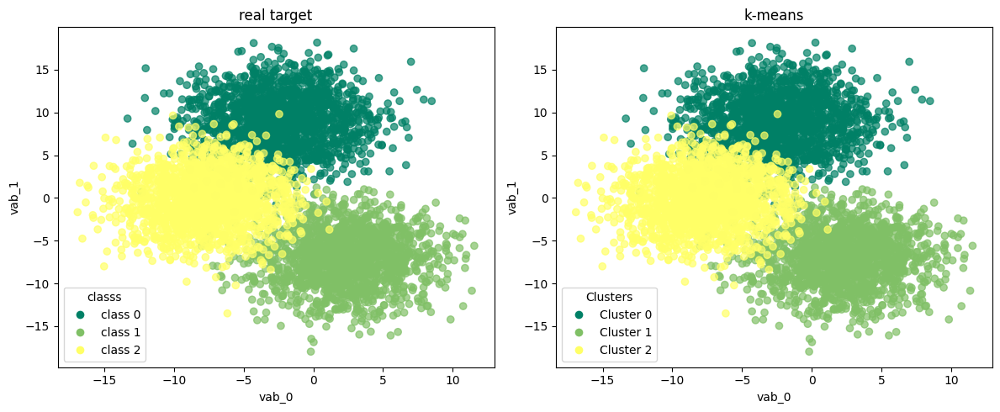

In [425]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

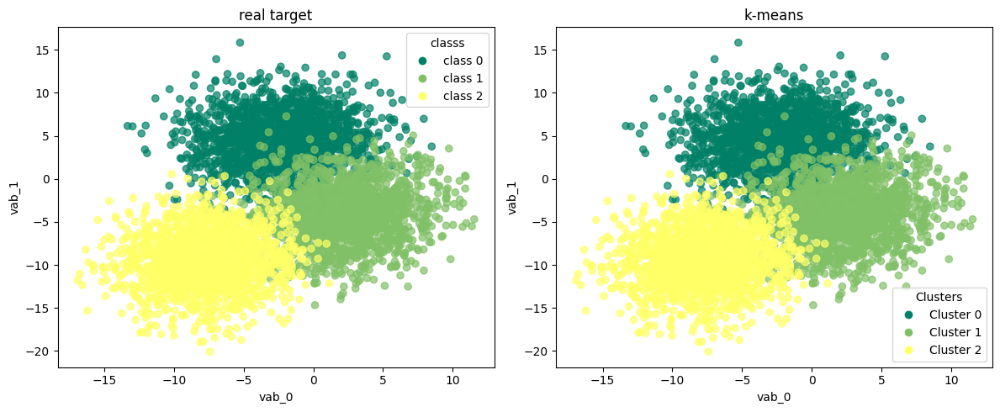

In [426]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

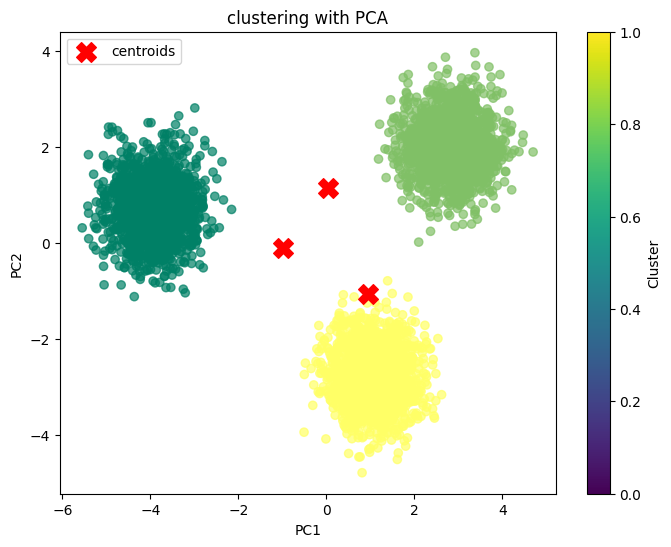

In [427]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

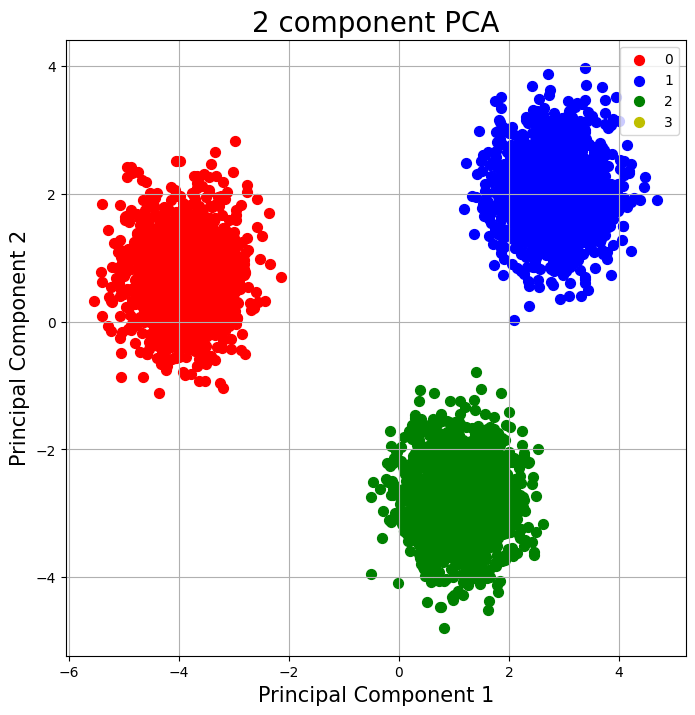

In [428]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [429]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [430]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [431]:
df_tsne_kmeans = corr_dataset.copy()

In [432]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [433]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [434]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [435]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


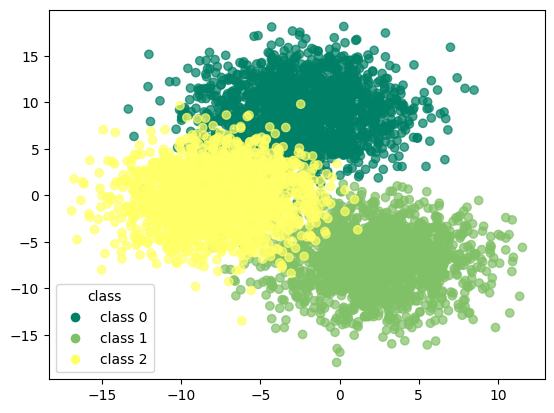

In [436]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

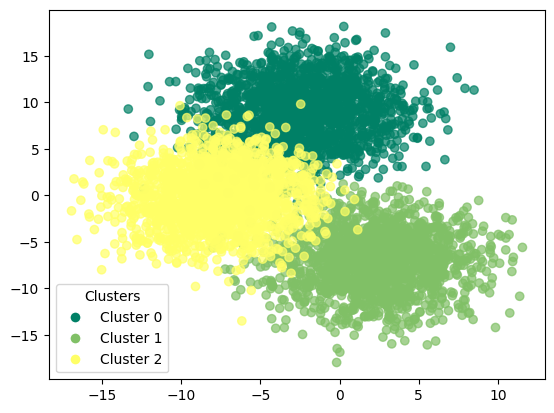

In [437]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

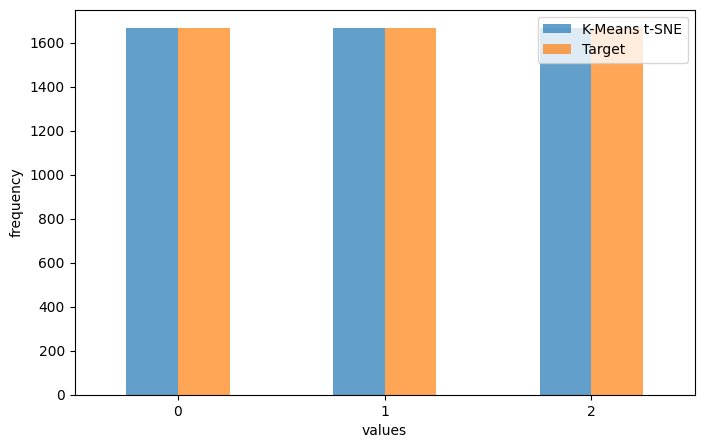

In [438]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [439]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [440]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### k-means with umap

In [441]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [442]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [443]:
df_umap_kmeans = corr_dataset.copy()

In [444]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [445]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [446]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [447]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


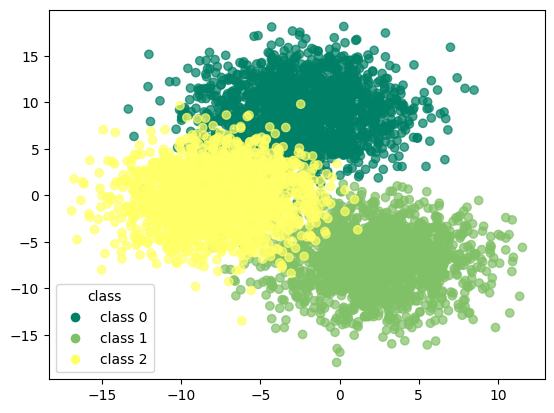

In [448]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

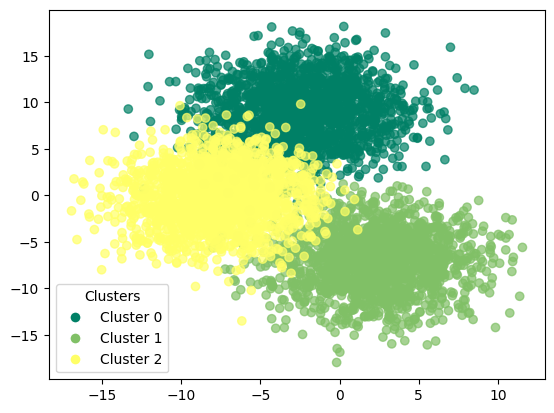

In [449]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

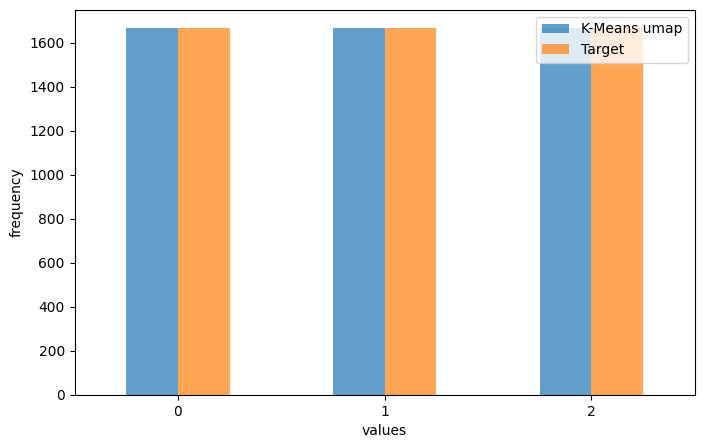

In [450]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [451]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [452]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## trimmed k-means

In [453]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [454]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [455]:
trimmed_kmeans

KMeans(n_clusters=3, random_state=42)

In [456]:
df_trim_kmeans = corr_dataset.copy()

In [457]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [458]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [459]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [460]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [461]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


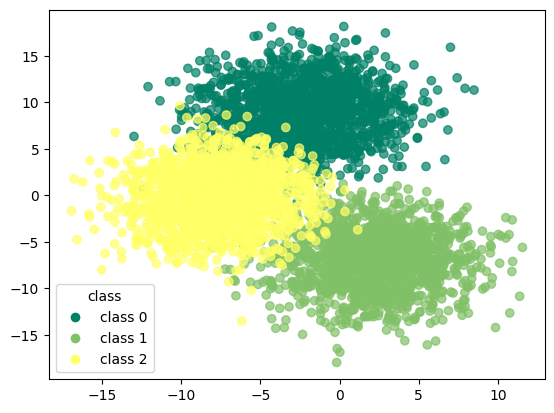

In [462]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

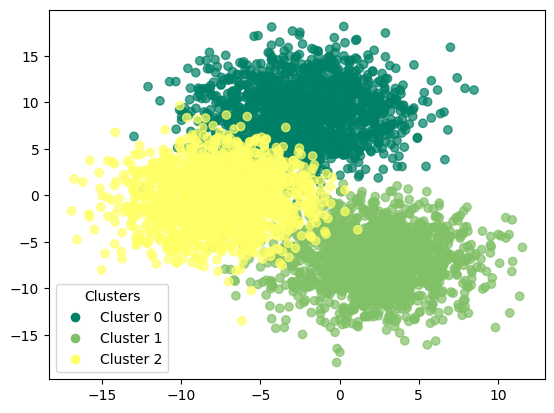

In [463]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [464]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1499    0    0]
 [   0 1501    0]
 [   0    0 1498]]


In [465]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1499
           1       1.00      1.00      1.00      1501
           2       1.00      1.00      1.00      1498

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



### trimmed k-means with pca

In [466]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [467]:
trim_kmeans_pca

KMeans(n_clusters=3, random_state=42)

In [468]:
df_pca_trim_kmeans = corr_dataset.copy()

In [469]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [470]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [471]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,1
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,1
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,1
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,1
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [472]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.3330369052912405
accuracy after: 0.9991107158737217


In [473]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


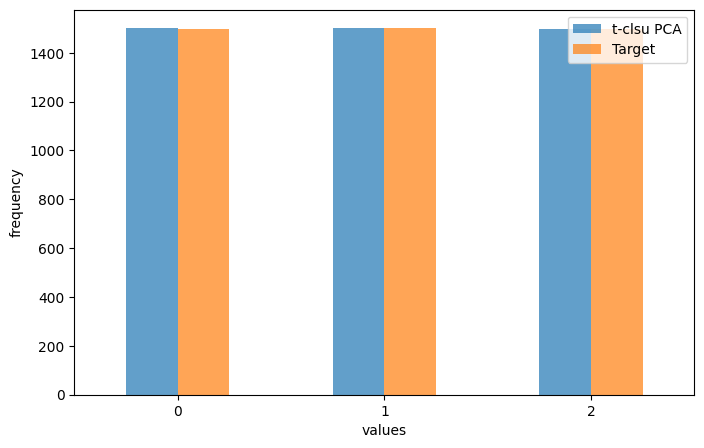

In [474]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [475]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1499    0    0]
 [   2 1499    0]
 [   0    2 1496]]


In [476]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1499
           1       1.00      1.00      1.00      1501
           2       1.00      1.00      1.00      1498

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



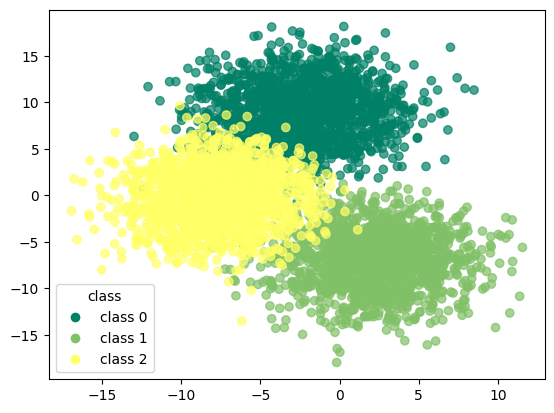

In [477]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

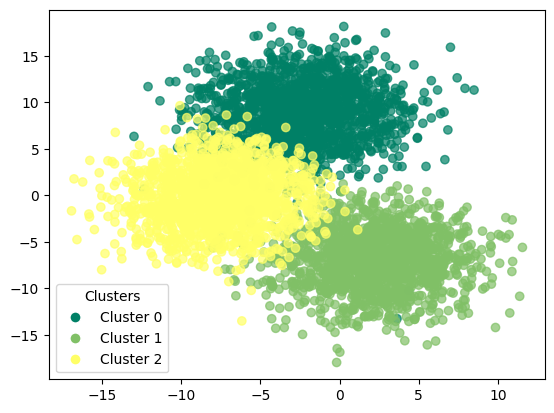

In [478]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

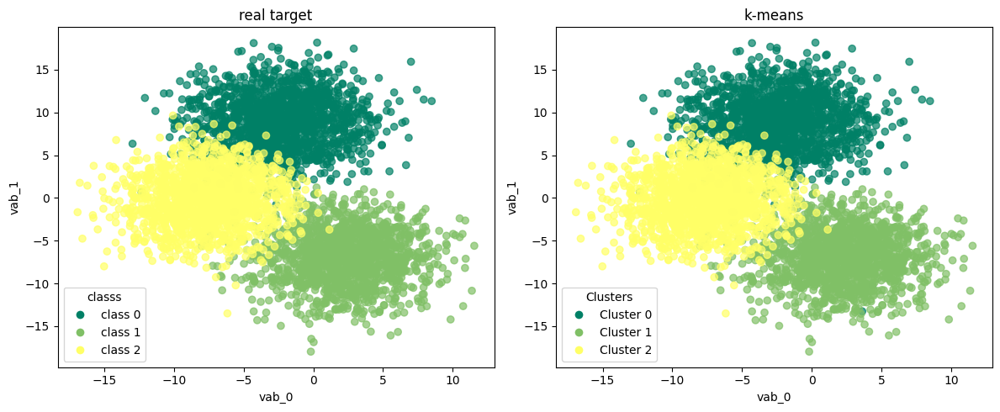

In [479]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

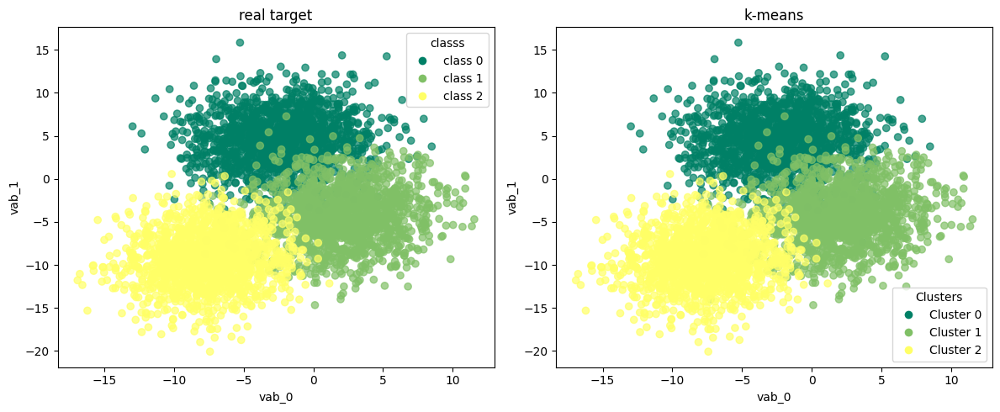

In [480]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [481]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [482]:
trim_kmeans_tsne

KMeans(n_clusters=3, random_state=42)

In [483]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [484]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [485]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [486]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [487]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.0026678523788350376
accuracy after: 0.9933303690529124


In [488]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


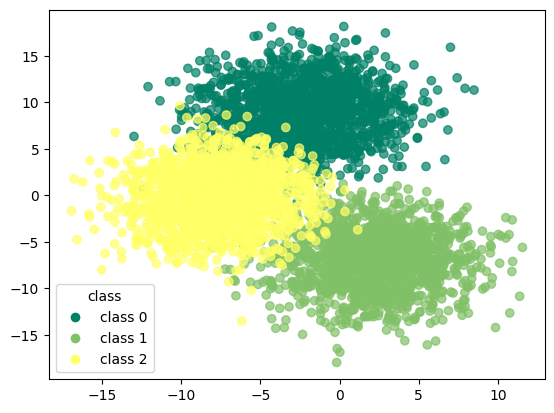

In [489]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

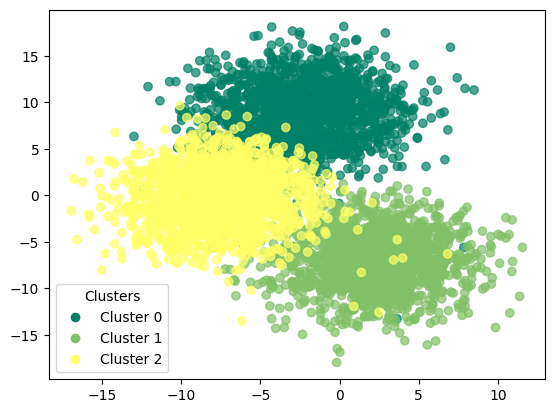

In [490]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

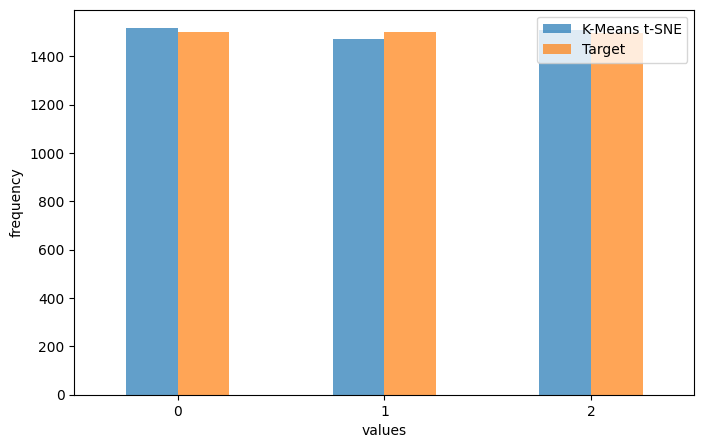

In [491]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [492]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1499    0    0]
 [  18 1471   12]
 [   0    0 1498]]


In [493]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1499
           1       1.00      0.98      0.99      1501
           2       0.99      1.00      1.00      1498

    accuracy                           0.99      4498
   macro avg       0.99      0.99      0.99      4498
weighted avg       0.99      0.99      0.99      4498



### trimmed k-means with umap

In [494]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [495]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [496]:
df_umap_trim_kmeans = corr_dataset.copy()

In [497]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [498]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [499]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,-3.189192,1.436203,-10.272015,3.203219,-7.323780,3.717997,1.681361,-2.215287,2.970193,-8.510050,...,2.960221,7.555689,-2.731929,9.827561,-7.483587,-4.217892,-5.731636,-1.188833,2,1
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1


In [500]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [501]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
5,-5.431898,10.140854,9.093832,0.714448,-6.729981,-7.401598,-4.319287,8.588068,1.866385,3.330755,...,6.971403,-3.944150,-3.539476,-9.234482,-2.352246,-1.089048,-3.411116,0.085265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,-3.189192,1.436203,-10.272015,3.203219,-7.323780,3.717997,1.681361,-2.215287,2.970193,-8.510050,...,2.960221,7.555689,-2.731929,9.827561,-7.483587,-4.217892,-5.731636,-1.188833,2,2
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2


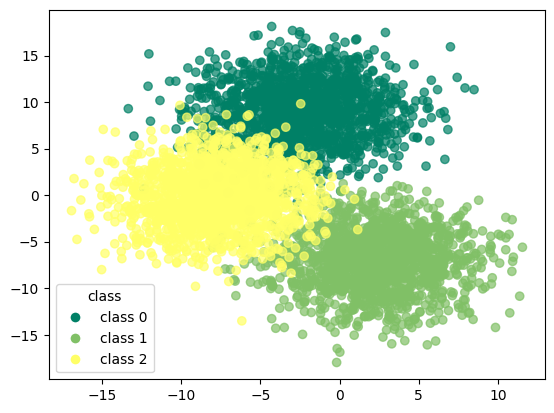

In [502]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

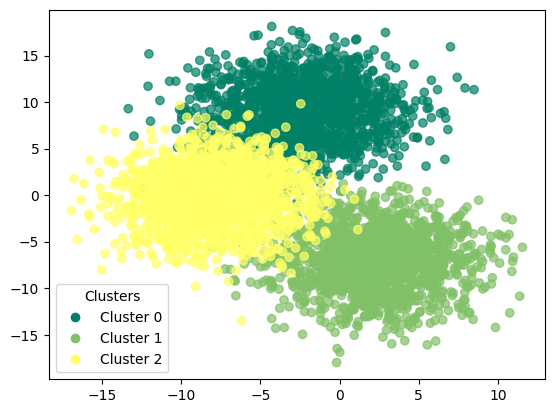

In [503]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

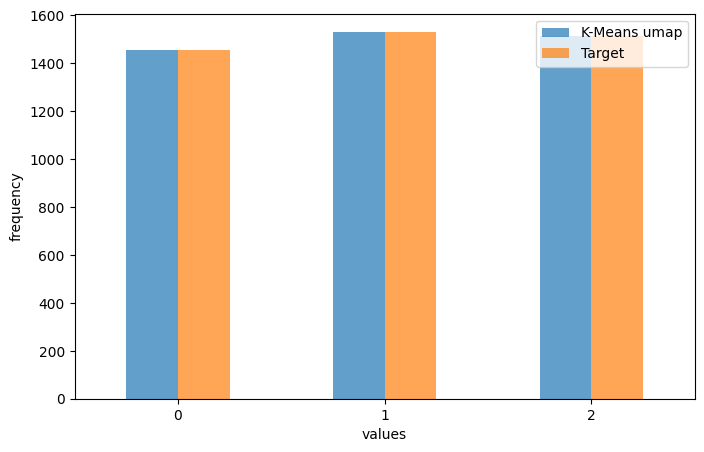

In [504]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [505]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1454    0    0]
 [   0 1530    0]
 [   0    0 1514]]


In [506]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1454
           1       1.00      1.00      1.00      1530
           2       1.00      1.00      1.00      1514

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



## dbscan

In [507]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

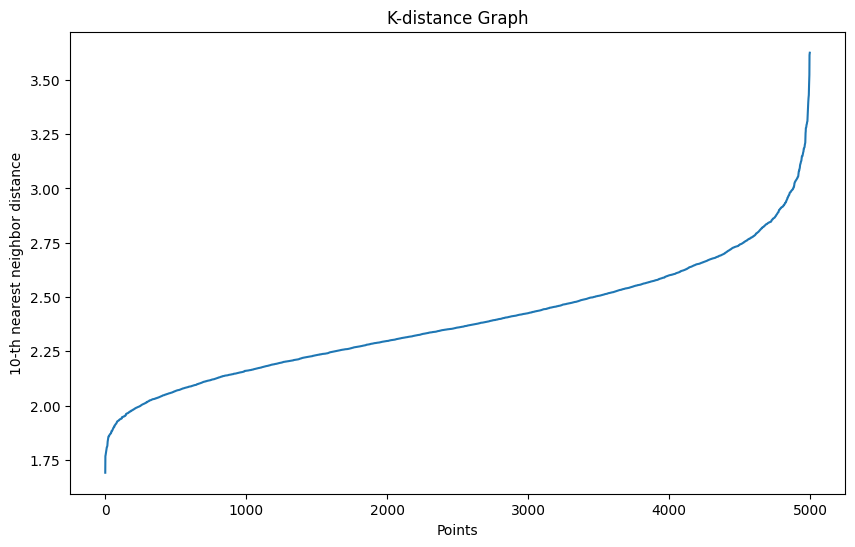

In [508]:
plot_k_distance_graph(X_values,k=10) 

In [509]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [510]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [511]:
df_dbscan = corr_dataset.copy()

In [512]:
df_dbscan['dbscan'] = dbscan.labels_

In [513]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [514]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,-1
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,-1
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,-1
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,-1
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,-1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,-1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,-1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,-1


In [515]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    4998
Name: count, dtype: int64


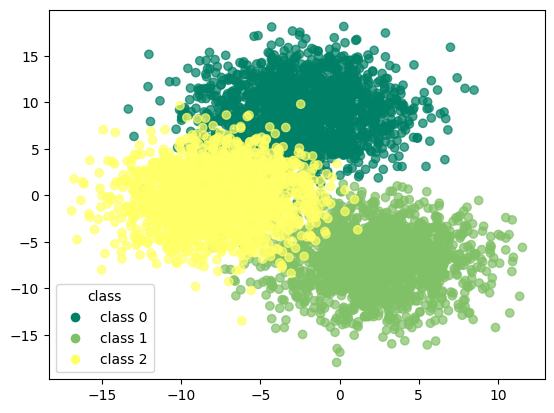

In [516]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

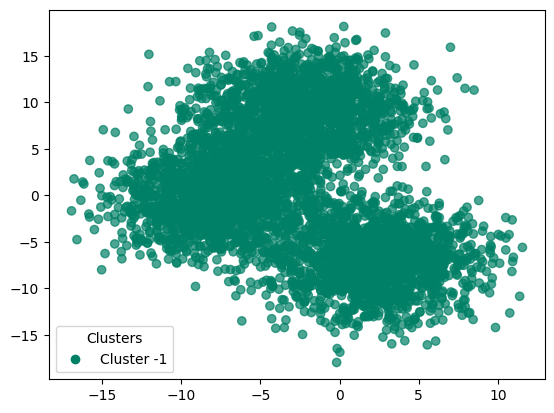

In [517]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [518]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


In [519]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



### dbscan with pca

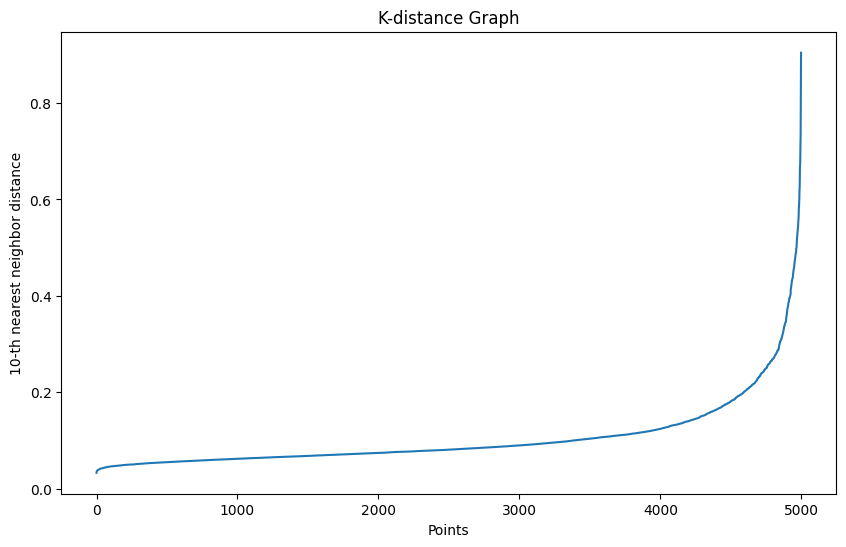

In [520]:
plot_k_distance_graph(X_pca,k=10)

In [521]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [522]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [523]:
df_pca_dbscan = corr_dataset.copy()

In [524]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [525]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.9977991196478592
accuracy after: 0.9977991196478592


In [526]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [527]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 1    1664
 2    1662
 0    1661
-1      11
Name: count, dtype: int64


In [528]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [   5 1661    0    0]
 [   2    0 1664    0]
 [   4    0    0 1662]]


In [529]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       0.75      0.75      0.75      4998
weighted avg       1.00      1.00      1.00      4998



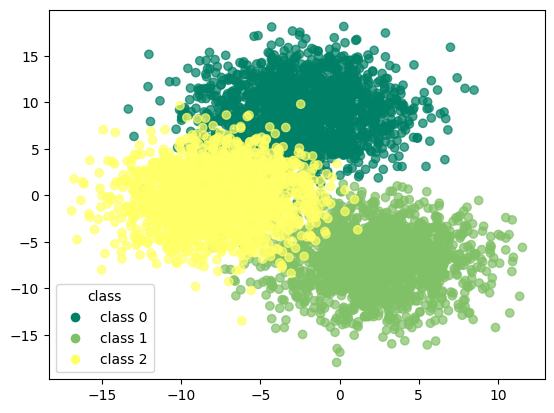

In [530]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

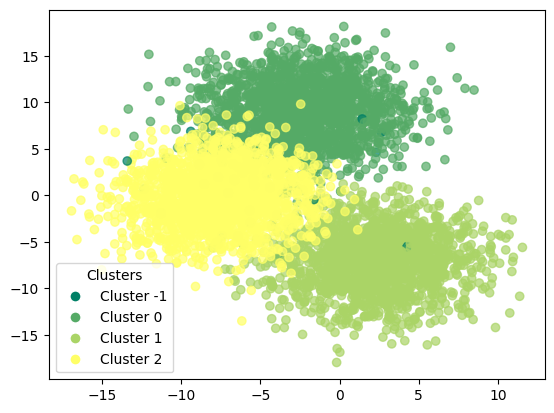

In [531]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

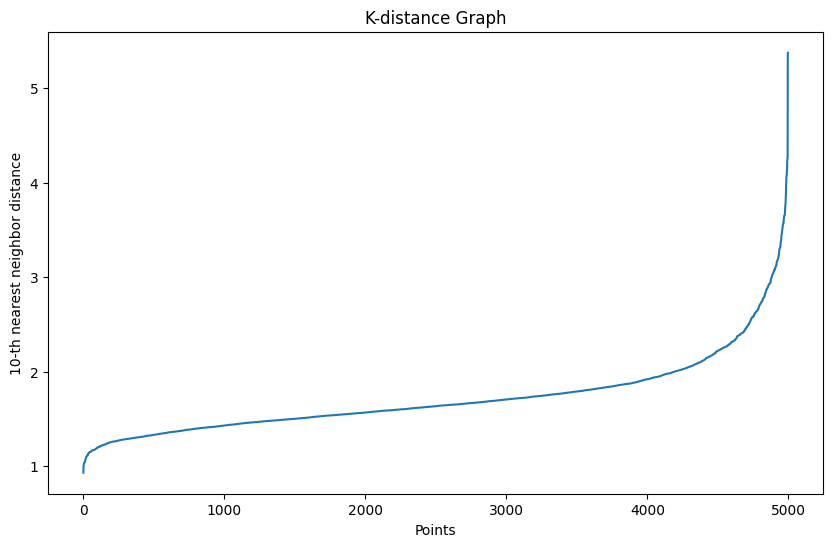

In [532]:
plot_k_distance_graph(X_tsne,k=10)

In [533]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [534]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [535]:
df_tsne_dbscan = corr_dataset.copy()

In [536]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [537]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.9973989595838335
accuracy after: 0.9973989595838335


In [538]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [539]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 2    1664
 1    1661
 0    1660
-1      13
Name: count, dtype: int64


In [540]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0]
 [   6 1660    0    0]
 [   5    0 1661    0]
 [   2    0    0 1664]]


In [541]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       0.75      0.75      0.75      4998
weighted avg       1.00      1.00      1.00      4998



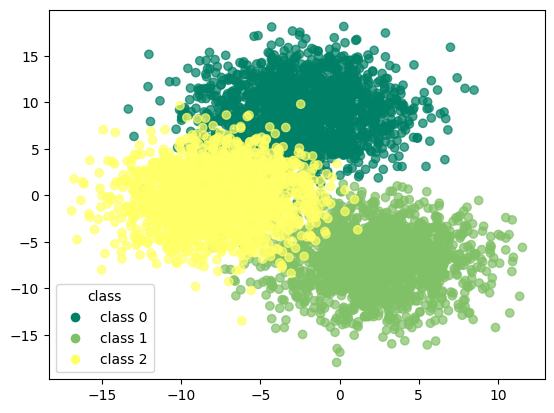

In [542]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

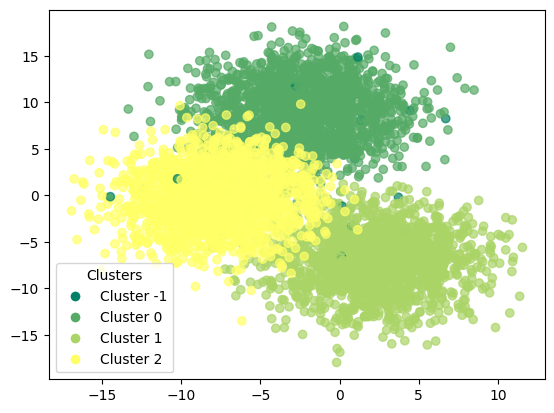

In [543]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

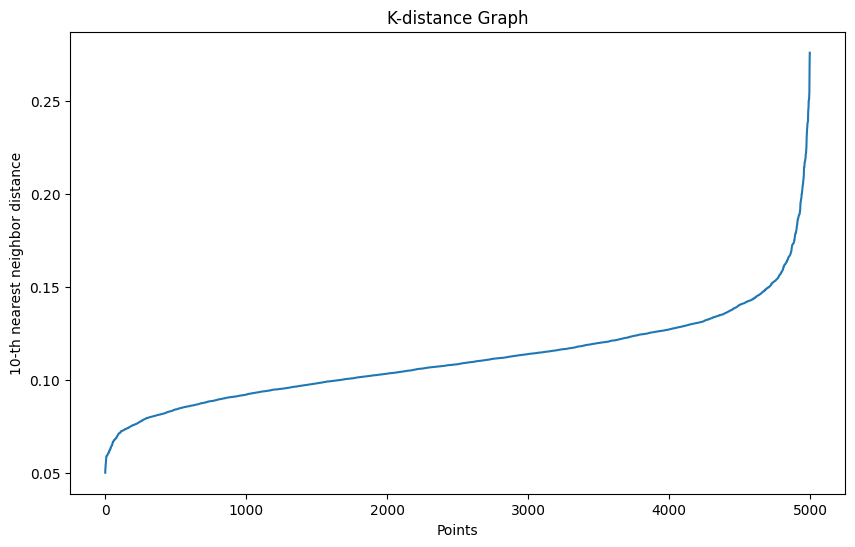

In [544]:
plot_k_distance_graph(X_umap,k=10)

In [545]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [546]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [547]:
df_umap_dbscan = corr_dataset.copy()

In [548]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [549]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [550]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [551]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    1666
1    1666
2    1666
Name: count, dtype: int64


In [552]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [553]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## GMM - Gaussian Mixture Models

In [554]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [555]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [556]:
df_gmm = corr_dataset.copy()

In [557]:
df_gmm['gmm'] = gmm.predict(X_values)

In [558]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [559]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [560]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


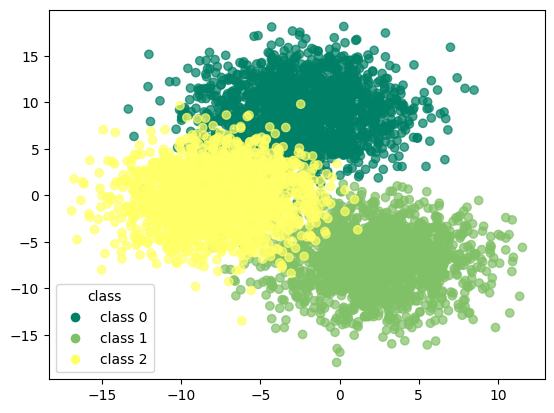

In [561]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

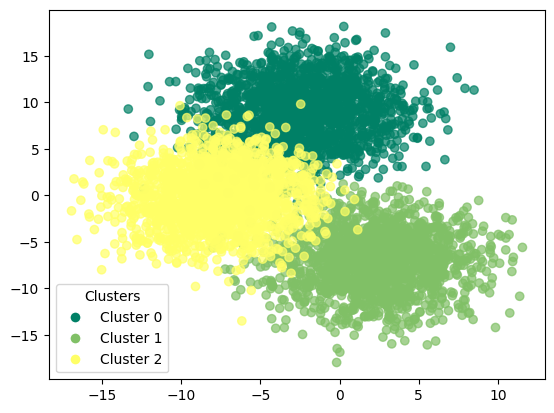

In [562]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [563]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [564]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### GMM with pca

In [565]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [566]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [567]:
df_pca_gmm = corr_dataset.copy()

In [568]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [569]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,1
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,1
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,1
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,1
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


In [570]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.3333333333333333
accuracy after: 1.0


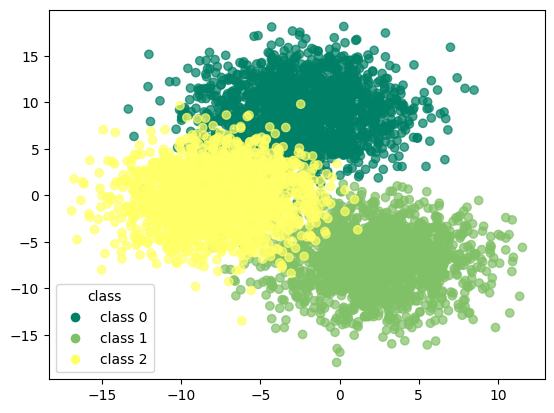

In [571]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

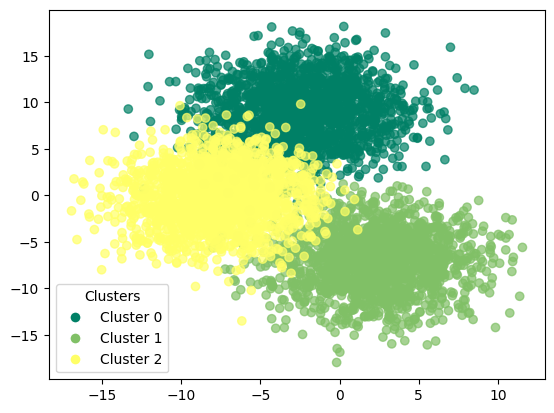

In [572]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [573]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [574]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### GMM with t-SNE

In [575]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [576]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [577]:
df_tsne_gmm = corr_dataset.copy()

In [578]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [579]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [580]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


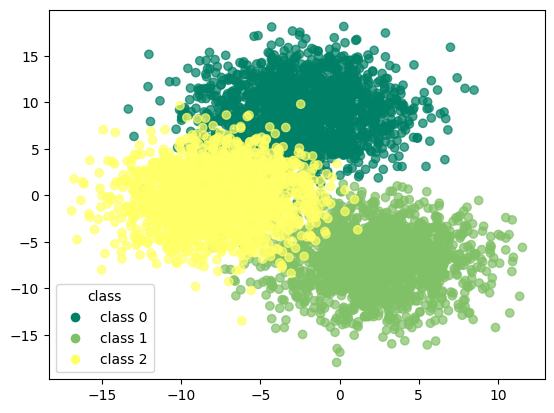

In [581]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

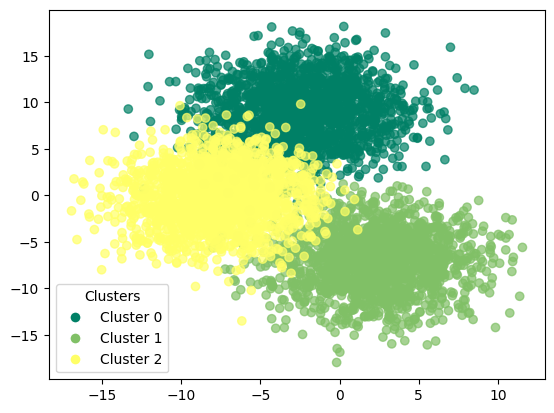

In [582]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [583]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [584]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### GMM with umap

In [585]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [586]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [587]:
df_umap_gmm = corr_dataset.copy()

In [588]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [589]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,2
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,2
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,2
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,2
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,1
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,1
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,1
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,1


In [590]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


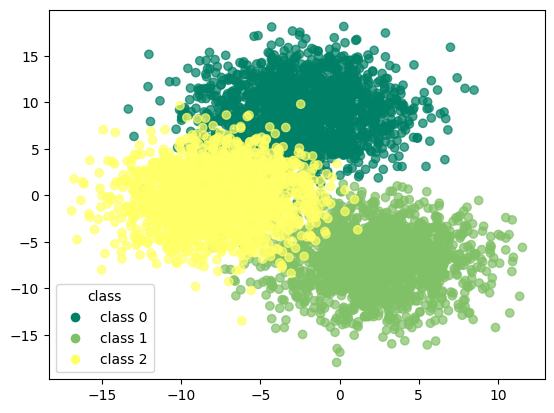

In [591]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

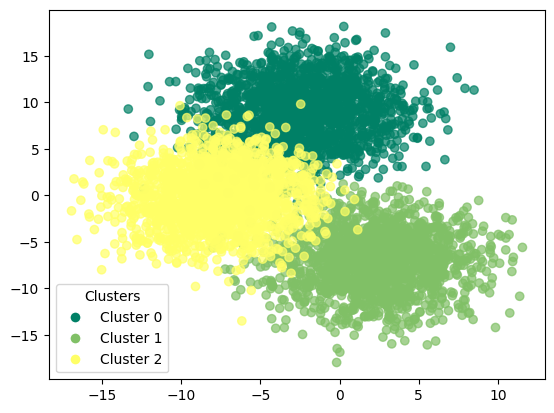

In [592]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [593]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [594]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## pam

In [595]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [596]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [597]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [598]:
pam.process()

In [599]:
clusters = pam.get_clusters()

In [600]:
medoids = pam.get_medoids()

In [601]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [602]:
df_pam = corr_dataset.copy()

In [603]:
df_pam['pam'] = labels

In [604]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,1.0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,1.0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,1.0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,1.0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2.0
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2.0
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2.0
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2.0


In [605]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.3333333333333333
accuracy after: 1.0


In [606]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


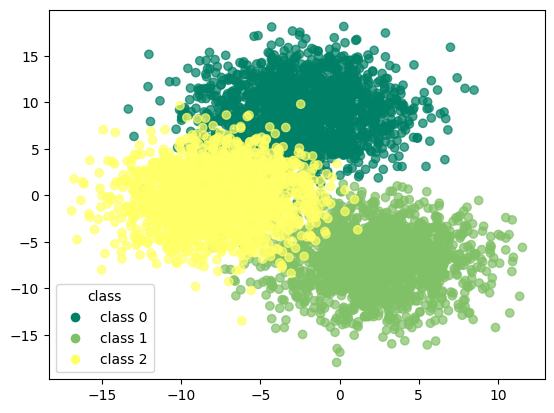

In [607]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

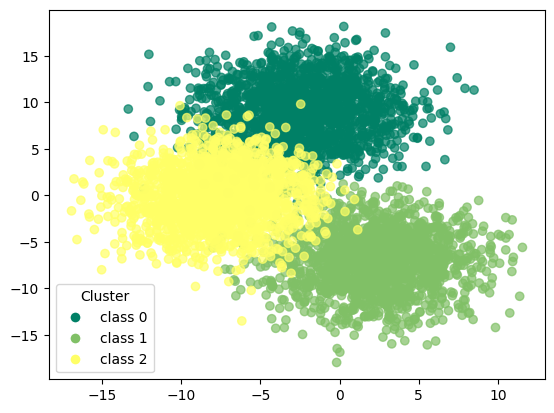

In [608]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [609]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [610]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### pam with pca

In [611]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [612]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [613]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [614]:
pam_pca.process()

In [615]:
clusters = pam_pca.get_clusters()

In [616]:
medoids = pam_pca.get_medoids()

In [617]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [618]:
df_pam_pca = corr_dataset.copy()

In [619]:
df_pam_pca['pam_pca'] = labels

In [620]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,1.0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,1.0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,1.0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,1.0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,0.0
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,0.0
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,0.0
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,0.0


In [621]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [622]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


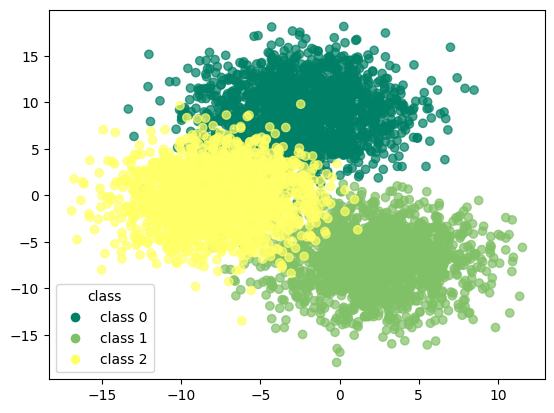

In [623]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

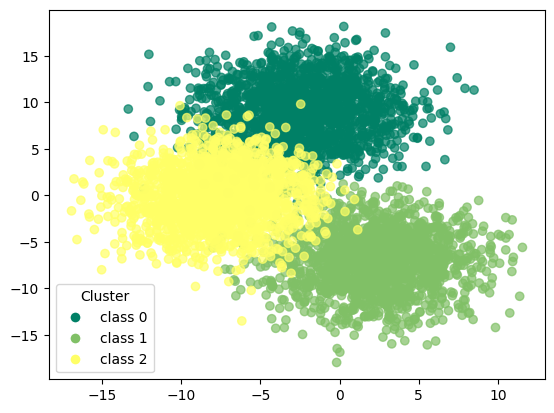

In [624]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [625]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [626]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### pam with t-SNE

In [627]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [628]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [629]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [630]:
pam_tsne.process()

In [631]:
clusters = pam_tsne.get_clusters()

In [632]:
medoids = pam_tsne.get_medoids()

In [633]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [634]:
df_pam_tsne = corr_dataset.copy()

In [635]:
df_pam_tsne['pam_tsne'] = labels

In [636]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0.0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0.0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0.0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0.0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2.0
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2.0
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2.0
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2.0


In [637]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [638]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


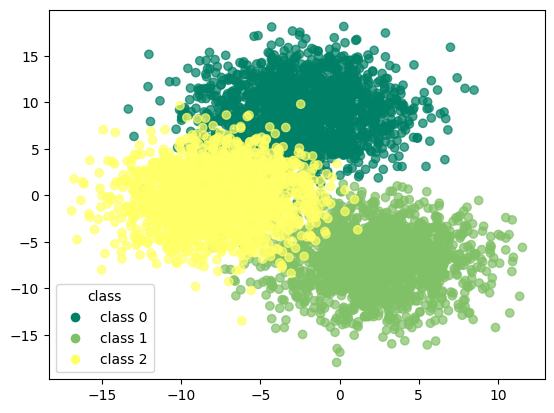

In [639]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

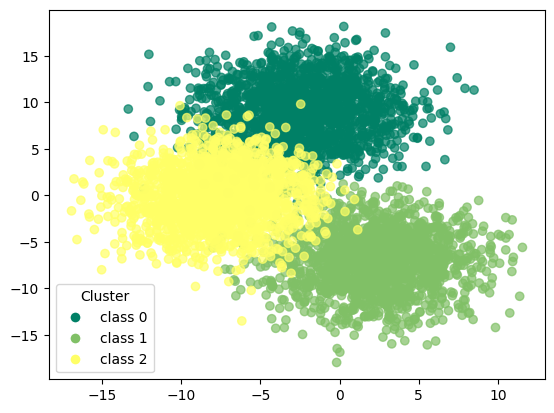

In [640]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [641]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [642]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



### pam with umap

In [643]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [644]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [645]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [646]:
pam_umap.process()

In [647]:
clusters = pam_umap.get_clusters()

In [648]:
medoids = pam_umap.get_medoids()

In [649]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [650]:
df_pam_umap = corr_dataset.copy()

In [651]:
df_pam_umap['pam_umap'] = labels

In [652]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0.0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0.0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0.0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0.0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2.0
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2.0
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2.0
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2.0


In [653]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [654]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,0.291839,8.803919,2.995984,5.626942,-4.415849,-6.445511,-4.226068,5.518415,3.922048,2.423731,...,8.394507,-3.934300,-6.274466,-6.451078,-10.928157,2.509568,-4.906797,-1.500914,0,0
1,-0.493882,4.538036,1.532819,6.508009,-3.431914,-5.378339,-10.979880,1.375640,3.447779,0.146604,...,4.885658,-6.567715,-3.972606,-7.481190,-7.312096,1.376415,-4.260468,-4.508506,0,0
2,0.878135,5.004967,6.488656,-0.367503,-8.533214,-6.914180,-9.501818,2.060034,4.834522,8.031133,...,4.831726,-9.445207,-6.649846,-9.202825,-3.428598,-2.730291,-7.633666,-15.849175,0,0
3,-4.033459,11.267959,9.041747,-2.079436,-4.223238,-10.121819,-8.231607,7.848083,3.351168,-2.243119,...,10.610960,-3.512793,-7.150712,-9.444727,-2.266954,0.730532,-1.613888,-3.276573,0,0
4,-2.634321,7.770936,2.071723,2.285449,-1.668770,-9.593364,-5.974308,10.079345,-2.266351,5.933365,...,12.965679,-2.650455,-10.018618,-4.849508,-6.938797,-1.273454,-0.980701,-0.426536,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-11.833750,-1.707209,-6.415695,14.719176,0.779848,4.105953,-3.455258,0.385648,4.957689,-3.901540,...,6.647731,10.972130,-2.564354,10.039391,-8.496434,-0.226394,-9.235561,-5.502539,2,2
4994,-7.375049,2.102435,-10.078416,6.773630,-5.240548,3.143796,-2.923340,-0.083343,3.472515,-8.014113,...,14.515148,10.875456,0.464795,7.638833,-10.776566,-5.953425,-8.753556,-2.338318,2,2
4995,-8.358172,2.975385,-1.859931,4.477553,-5.620583,2.906701,-6.203593,0.459038,1.679579,-2.608107,...,17.004678,14.911403,0.338090,13.942529,-9.855055,-5.865193,-8.843117,-5.532209,2,2
4996,-5.053469,3.454699,-8.465986,4.388678,2.226515,9.276639,-2.908942,1.247391,4.433485,-8.251233,...,6.023986,4.309268,4.629975,4.963361,-7.335985,-3.810095,-7.451889,-8.323751,2,2


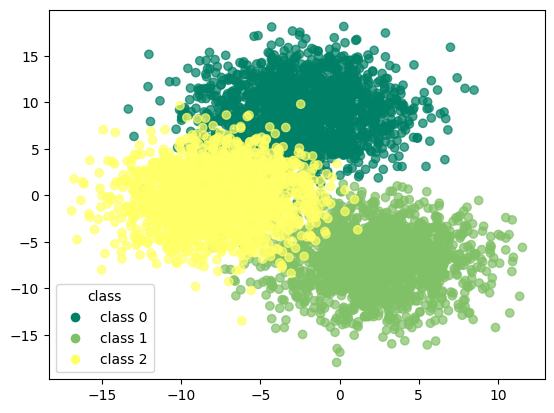

In [655]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

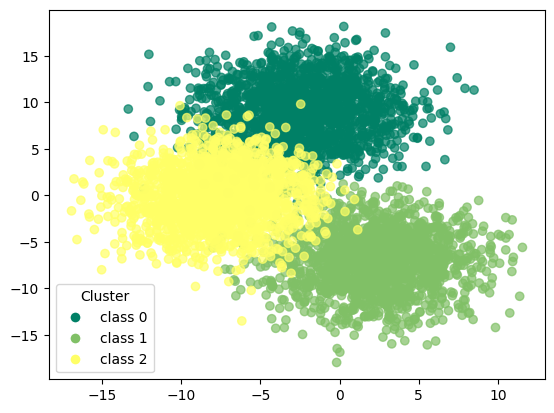

In [656]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [657]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [658]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



# overall results k-means

## basic

In [659]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [660]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + pca

In [661]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [662]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + t-SNE

In [663]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [664]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + UMAP

In [665]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [666]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


# overall results trimmed k-means

## basic

In [667]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1499
           1       1.00      1.00      1.00      1501
           2       1.00      1.00      1.00      1498

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



In [668]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1499    0    0]
 [   0 1501    0]
 [   0    0 1498]]


## + pca

In [669]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1499
           1       1.00      1.00      1.00      1501
           2       1.00      1.00      1.00      1498

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



In [670]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1499    0    0]
 [   2 1499    0]
 [   0    2 1496]]


## + t-SNE

In [671]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1499
           1       1.00      0.98      0.99      1501
           2       0.99      1.00      1.00      1498

    accuracy                           0.99      4498
   macro avg       0.99      0.99      0.99      4498
weighted avg       0.99      0.99      0.99      4498



In [672]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1499    0    0]
 [  18 1471   12]
 [   0    0 1498]]


## + UMAP

In [673]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1454
           1       1.00      1.00      1.00      1530
           2       1.00      1.00      1.00      1514

    accuracy                           1.00      4498
   macro avg       1.00      1.00      1.00      4498
weighted avg       1.00      1.00      1.00      4498



In [674]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1454    0    0]
 [   0 1530    0]
 [   0    0 1514]]


# overall results dbscan

## basic

In [675]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



In [676]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


## + pca

In [677]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       0.75      0.75      0.75      4998
weighted avg       1.00      1.00      1.00      4998



In [678]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [   5 1661    0    0]
 [   2    0 1664    0]
 [   4    0    0 1662]]


## + t-SNE

In [679]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       0.75      0.75      0.75      4998
weighted avg       1.00      1.00      1.00      4998



In [680]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0]
 [   6 1660    0    0]
 [   5    0 1661    0]
 [   2    0    0 1664]]


## + UMAP

In [681]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [682]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


# overall results GMM

## basic

In [683]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [684]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + pca

In [685]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [686]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + t-SNE

In [687]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [688]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


## + UMAP

In [689]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



In [690]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


# overall results pam

## basic

In [691]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [692]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## + pca

In [693]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [694]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## + t-SNE

In [695]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [696]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998



## + umap

In [697]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1666    0    0]
 [   0 1666    0]
 [   0    0 1666]]


In [698]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00      1666
           2       1.00      1.00      1.00      1666

    accuracy                           1.00      4998
   macro avg       1.00      1.00      1.00      4998
weighted avg       1.00      1.00      1.00      4998

